# Importing necessary package for data preparation

In [1]:
import pandas as pd
import numpy as np
import scipy.stats
import seaborn as sns
import pyodbc
import matplotlib.pyplot as plt
from sklearn.metrics .pairwise import cosine_similarity
import warnings 
warnings.filterwarnings('ignore')
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.cluster import KMeans
from scipy.sparse import csr_matrix


C:\Users\TITILAYO\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


# Download Data from SQL Server

In [2]:
# Connect to SQL Server
conn_str = (
    "Driver={ODBC Driver 17 for SQL Server};"
    "Server=TWELVE\\MSSQLSERVER01;"
    "Database=AdventureWorksDW2022;"
    "Trusted_Connection=yes;"
)
conn = pyodbc.connect(conn_str)

# Load data into a DataFrame
query = """
SELECT 
    p.ProductAlternateKey AS ProductID, 
    p.EnglishProductName AS ProductName, 
    f.CustomerKey AS CustomerID, 
    f.OrderQuantity
FROM 
    FactInternetSales f
JOIN 
    DimProduct p
ON 
    f.ProductKey = p.ProductKey;
"""

df = pd.read_sql_query(query, conn)
conn.close()

print(df)


        ProductID              ProductName  CustomerID  OrderQuantity
0      BK-R93R-62         Road-150 Red, 62       21768              1
1      BK-M82S-44  Mountain-100 Silver, 44       28389              1
2      BK-M82S-44  Mountain-100 Silver, 44       25863              1
3      BK-R50B-62       Road-650 Black, 62       14501              1
4      BK-M82S-44  Mountain-100 Silver, 44       11003              1
...           ...                      ...         ...            ...
60393     FE-6654    Fender Set - Mountain       15868              1
60394     CA-1098             AWC Logo Cap       15868              1
60395     FE-6654    Fender Set - Mountain       18759              1
60396     ST-1401   All-Purpose Bike Stand       18759              1
60397     CA-1098             AWC Logo Cap       18759              1

[60398 rows x 4 columns]


# Exploratory Data analysis

In [3]:
#dimensions of the data
df.shape

(60398, 4)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60398 entries, 0 to 60397
Data columns (total 4 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   ProductID      60398 non-null  object
 1   ProductName    60398 non-null  object
 2   CustomerID     60398 non-null  int64 
 3   OrderQuantity  60398 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 1.8+ MB


In [5]:
#Statistical observation of data

df.describe()

,CustomerID,OrderQuantity
count,60398.000000,60398.0
mean,18841.685420,1.0
std,5432.430404,0.0
min,11000.000000,1.0
25%,14003.000000,1.0
50%,18143.000000,1.0
75%,23429.750000,1.0
max,29483.000000,1.0


In [6]:
# Ensure DataFrame or df has the required columns
unique_df = df[['ProductName', 'ProductID', 'CustomerID', 'OrderQuantity']].drop_duplicates()

# Display the unique DataFrame
print(unique_df)

                   ProductName   ProductID  CustomerID  OrderQuantity
0             Road-150 Red, 62  BK-R93R-62       21768              1
1      Mountain-100 Silver, 44  BK-M82S-44       28389              1
2      Mountain-100 Silver, 44  BK-M82S-44       25863              1
3           Road-650 Black, 62  BK-R50B-62       14501              1
4      Mountain-100 Silver, 44  BK-M82S-44       11003              1
...                        ...         ...         ...            ...
60393    Fender Set - Mountain     FE-6654       15868              1
60394             AWC Logo Cap     CA-1098       15868              1
60395    Fender Set - Mountain     FE-6654       18759              1
60396   All-Purpose Bike Stand     ST-1401       18759              1
60397             AWC Logo Cap     CA-1098       18759              1

[58922 rows x 4 columns]


Data Cleaning

In [7]:
 #Check for missing values
print(df.isnull().sum())

ProductID        0
ProductName      0
CustomerID       0
OrderQuantity    0
dtype: int64


In [8]:
df = df.drop_duplicates()


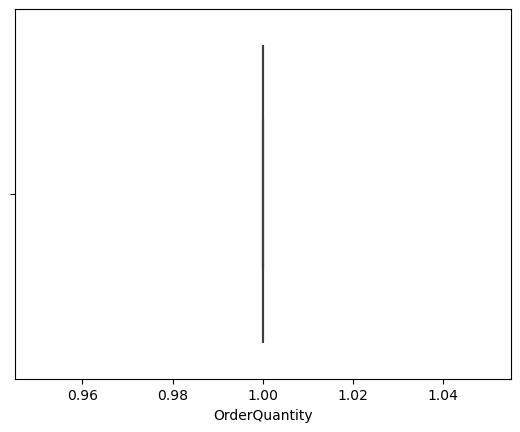

In [9]:

# Boxplot for outliers
sns.boxplot(x=df['OrderQuantity'])
plt.show()


# Most Popular Product

Based on Frequency of Orders:

Number of times each product appears in the dataset.

In [10]:
# Count the number of orders for each product
popular_products = df['ProductName'].value_counts().reset_index()
popular_products.columns = ['ProductName', 'OrderCount']
print(popular_products.head())


             ProductName  OrderCount
0  Water Bottle - 30 oz.        4073
1     Mountain Tire Tube        2960
2    Patch Kit/8 Patches        2950
3         Road Tire Tube        2226
4  Sport-100 Helmet, Red        2147


Based on Total Order Quantity

In [11]:
print(df.columns)  # Verify the column names


Index(['ProductID', 'ProductName', 'CustomerID', 'OrderQuantity'], dtype='object')


# Check most popular product using visuals

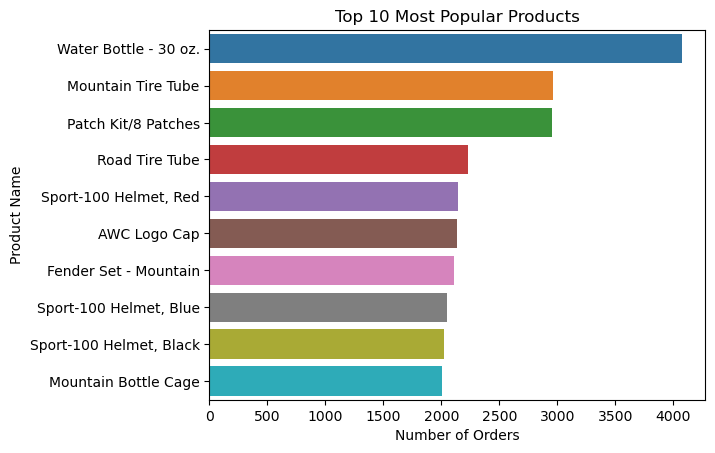

In [12]:
# Bar plot for top 10 products by order count
sns.barplot(x='OrderCount', y='ProductName', data=popular_products.head(10))
plt.title('Top 10 Most Popular Products')
plt.xlabel('Number of Orders')
plt.ylabel('Product Name')
plt.show()


# Popular Products Based on Total Order Quantity

In [13]:
popular_products_quantity = df.groupby('ProductName')['OrderQuantity'].sum().reset_index()
popular_products_quantity = popular_products_quantity.sort_values(by='OrderQuantity', ascending=False)
print(popular_products_quantity.head())


               ProductName  OrderQuantity
126  Water Bottle - 30 oz.           4073
23      Mountain Tire Tube           2960
52     Patch Kit/8 Patches           2950
56          Road Tire Tube           2226
101  Sport-100 Helmet, Red           2147


# Most Purchased Products by Order Count

In [14]:
# Count how many times each product appears in the dataset
popular_products_count = df['ProductName'].value_counts().reset_index()

# Rename columns for clarity
popular_products_count.columns = ['ProductName', 'OrderCount']

# Display the top 10 most purchased products
print(popular_products_count.head(10))


               ProductName  OrderCount
0    Water Bottle - 30 oz.        4073
1       Mountain Tire Tube        2960
2      Patch Kit/8 Patches        2950
3           Road Tire Tube        2226
4    Sport-100 Helmet, Red        2147
5             AWC Logo Cap        2132
6    Fender Set - Mountain        2110
7   Sport-100 Helmet, Blue        2050
8  Sport-100 Helmet, Black        2024
9     Mountain Bottle Cage        2004


In [15]:
# Group by ProductName and calculate the average order quantity
avg_order_quantity = df.groupby('ProductName')['OrderQuantity'].mean().reset_index()

# Rename the column for clarity
avg_order_quantity.columns = ['ProductName', 'AvgOrderQuantity']

# Display the first few rows of the average order quantity for each product
print(avg_order_quantity.head())


              ProductName  AvgOrderQuantity
0            AWC Logo Cap               1.0
1  All-Purpose Bike Stand               1.0
2   Bike Wash - Dissolver               1.0
3         Classic Vest, L               1.0
4         Classic Vest, M               1.0


# Calculate the Average Order Quantity for Each Product

In [16]:
# Merge the original df with the average order quantity
df_with_avg_quantity = pd.merge(df, avg_order_quantity, on='ProductName', how='left')

# Display the resulting DataFrame with the average order quantity
print(df_with_avg_quantity.head())


    ProductID              ProductName  CustomerID  OrderQuantity  \
0  BK-R93R-62         Road-150 Red, 62       21768              1   
1  BK-M82S-44  Mountain-100 Silver, 44       28389              1   
2  BK-M82S-44  Mountain-100 Silver, 44       25863              1   
3  BK-R50B-62       Road-650 Black, 62       14501              1   
4  BK-M82S-44  Mountain-100 Silver, 44       11003              1   

   AvgOrderQuantity  
0               1.0  
1               1.0  
2               1.0  
3               1.0  
4               1.0  


# Create user product matrix

In [17]:
# Assuming `df` is the DataFrame with your data
user_product_matrix = df.pivot_table(
    index='CustomerID',          # Rows: CustomerID
    columns='ProductID',         # Columns: ProductID (or ProductName if preferred)
    values='OrderQuantity',      # Values: OrderQuantity
    aggfunc='sum',               # Aggregate function: sum to get total quantity ordered
    fill_value=0                 # Fill missing values with 0
)

# Display the user-product matrix
print(user_product_matrix)

ProductID   BC-M005  BC-R205  BK-M18B-40  BK-M18B-42  BK-M18B-44  BK-M18B-48  \
CustomerID                                                                     
11000             0        0           0           0           0           0   
11001             1        1           0           0           0           0   
11002             0        0           0           0           0           0   
11003             1        0           0           0           0           0   
11004             0        0           0           0           0           0   
...             ...      ...         ...         ...         ...         ...   
29479             0        0           0           0           0           0   
29480             0        1           0           0           0           0   
29481             0        0           0           0           0           0   
29482             0        0           0           0           0           0   
29483             0        0           0

# Create a user move matrix

The aim of the User-move Matrix is to calculate transitions between products purchased or interacted with by the same user (CustomerID). The resulting matrix will show how users move between products.

In [19]:
# SQL query to fetch data
query = """
SELECT 
    p.ProductAlternateKey AS ProductID, 
    p.EnglishProductName AS ProductName, 
    f.CustomerKey AS CustomerID, 
    f.OrderQuantity, 
    f.OrderDate
FROM 
    FactInternetSales f
JOIN 
    DimProduct p
ON 
    f.ProductKey = p.ProductKey;
"""

# Connect to SQL Server
conn_str = (
    "Driver={ODBC Driver 17 for SQL Server};"
    "Server=TWELVE\\MSSQLSERVER01;"
    "Database=AdventureWorksDW2022;"
    "Trusted_Connection=yes;"
)
conn = pyodbc.connect(conn_str)

# Execute the query and fetch data
df = pd.read_sql_query(query, conn)
conn.close()

# Ensure OrderDate is a datetime type for sorting
df['OrderDate'] = pd.to_datetime(df['OrderDate'])

# Sort by CustomerID and OrderDate
df = df.sort_values(by=['CustomerID', 'OrderDate'])

# Create a "NextProduct" column using shift
df['NextProduct'] = df.groupby('CustomerID')['ProductName'].shift(-1)

# Filter out rows where there is a transition
df_transitions = df.dropna(subset=['NextProduct'])

# Count transitions between products
transition_counts = df_transitions.groupby(['ProductName', 'NextProduct']).size().reset_index(name='TransitionCount')

# Pivot to create the User Move Matrix
user_move_matrix = transition_counts.pivot(index='ProductName', columns='NextProduct', values='TransitionCount').fillna(0)

# Display results
print("Transition Counts:")
print(transition_counts)

print("\nUser Move Matrix:")
print(user_move_matrix)


Transition Counts:
                     ProductName              NextProduct  TransitionCount
0                   AWC Logo Cap             AWC Logo Cap                5
1                   AWC Logo Cap   All-Purpose Bike Stand                2
2                   AWC Logo Cap    Bike Wash - Dissolver                6
3                   AWC Logo Cap          Classic Vest, L                1
4                   AWC Logo Cap          Classic Vest, M                1
...                          ...                      ...              ...
4160  Women's Mountain Shorts, S  Sport-100 Helmet, Black                1
4161  Women's Mountain Shorts, S             Touring Tire                1
4162  Women's Mountain Shorts, S        Touring Tire Tube                2
4163  Women's Mountain Shorts, S    Touring-3000 Blue, 54                1
4164  Women's Mountain Shorts, S  Touring-3000 Yellow, 44                1

[4165 rows x 3 columns]

User Move Matrix:
NextProduct                 AWC Logo 

# Visualize the matrix using seaborn

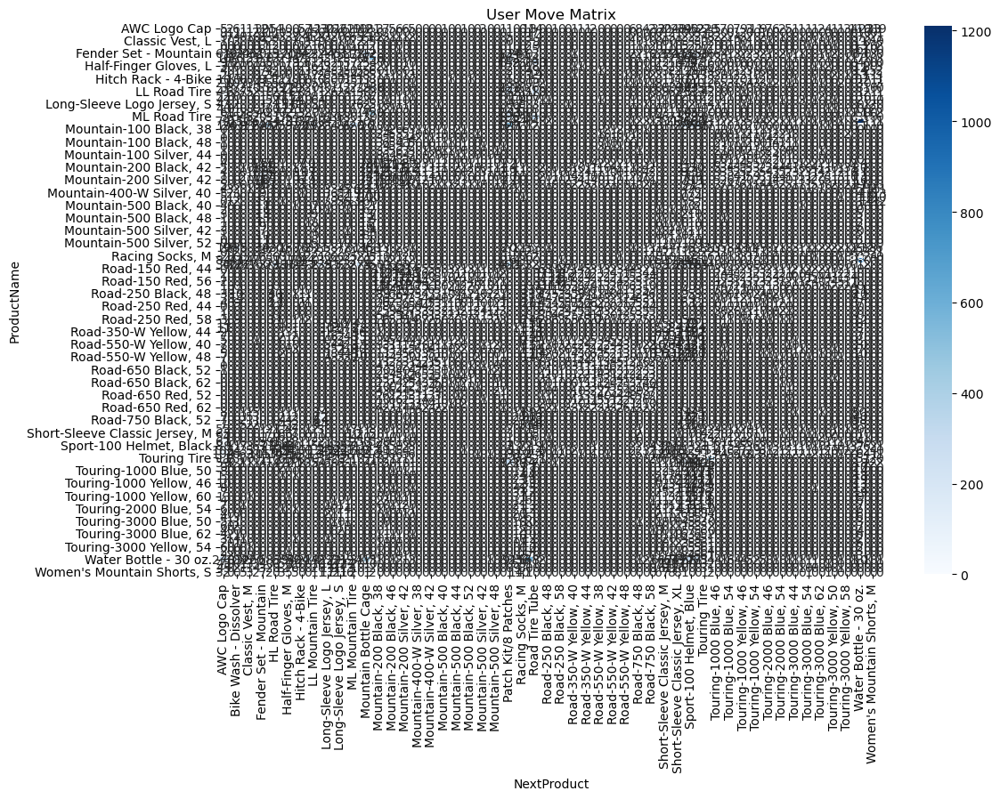

In [21]:
plt.figure(figsize=(12, 8))
sns.heatmap(user_move_matrix, annot=True, fmt=".0f", cmap="Blues")
plt.title("User Move Matrix")
plt.show()


# Data Normalization Process

In [22]:
#existing dataframe: transition_counts
# Columns: ProductName, NextProduct, TransitionCount
scaler = MinMaxScaler()
transition_counts['NormalizedCount'] = scaler.fit_transform(transition_counts[['TransitionCount']])

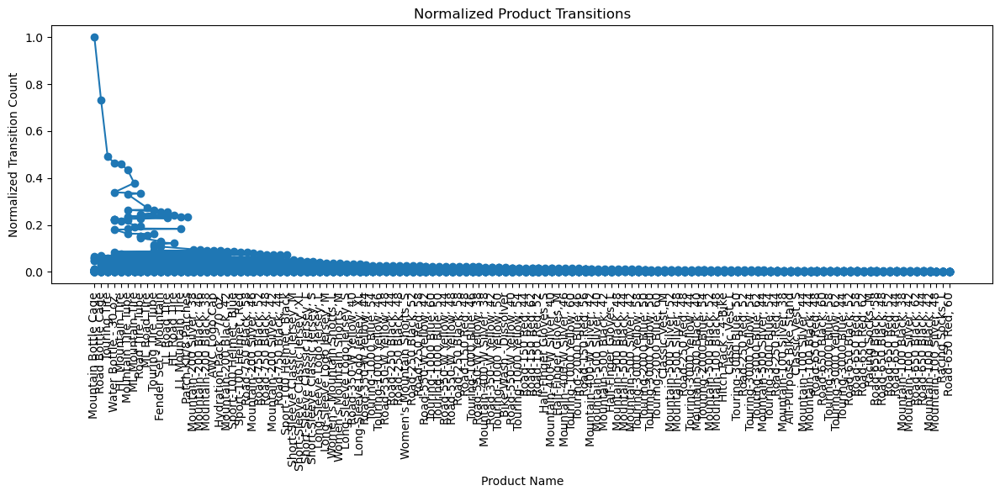

In [23]:
# Sort data for visualization
transition_counts_sorted = transition_counts.sort_values('NormalizedCount', ascending=False)

# Line plot
plt.figure(figsize=(12, 6))
plt.plot(transition_counts_sorted['ProductName'], transition_counts_sorted['NormalizedCount'], marker='o')
plt.xticks(rotation=90)
plt.title('Normalized Product Transitions')
plt.xlabel('Product Name')
plt.ylabel('Normalized Transition Count')
plt.tight_layout()
plt.show()


# Normalization using the Minmax scaling

In [24]:
# Database connection
connection_string = (
    "Driver={ODBC Driver 17 for SQL Server};"
    "Server=TWELVE\MSSQLSERVER01;"
    "Database=AdventureWorksDW2022;"
    "Trusted_Connection=yes;"
)
conn = pyodbc.connect(connection_string)

# SQL Query
query = """
    SELECT 
    p.ProductAlternateKey AS ProductID, 
    p.EnglishProductName AS ProductName, 
    f.CustomerKey AS CustomerID, 
    f.OrderQuantity, 
    f.OrderDate
    FROM 
        FactInternetSales f
    JOIN 
        DimProduct p
    ON 
        f.ProductKey = p.ProductKey;
"""

# Fetch data into a Pandas DataFrame
data = pd.read_sql(query, conn)

# Close the connection
conn.close()

# Display the first few rows of the dataset
print("Original Dataset:")
print(data.head())

# Check for missing values
print("\nMissing Values in Data:")
print(data.isnull().sum())

# Min-Max Normalization
scaler = MinMaxScaler()
data['OrderQuantity_MinMax'] = scaler.fit_transform(data[['OrderQuantity']])

# Display normalized data
print("\nNormalized Dataset:")
print(data[['ProductName', 'CustomerID','ProductID', 'OrderDate','OrderQuantity', 'OrderQuantity_MinMax']].head())

# Save the normalized data to a CSV file (optional)
data.to_csv("normalized_adventureworks_data.csv", index=False)


Original Dataset:
    ProductID              ProductName  CustomerID  OrderQuantity  OrderDate
0  BK-R93R-62         Road-150 Red, 62       21768              1 2010-12-29
1  BK-M82S-44  Mountain-100 Silver, 44       28389              1 2010-12-29
2  BK-M82S-44  Mountain-100 Silver, 44       25863              1 2010-12-29
3  BK-R50B-62       Road-650 Black, 62       14501              1 2010-12-29
4  BK-M82S-44  Mountain-100 Silver, 44       11003              1 2010-12-29

Missing Values in Data:
ProductID        0
ProductName      0
CustomerID       0
OrderQuantity    0
OrderDate        0
dtype: int64

Normalized Dataset:
               ProductName  CustomerID   ProductID  OrderDate  OrderQuantity  \
0         Road-150 Red, 62       21768  BK-R93R-62 2010-12-29              1   
1  Mountain-100 Silver, 44       28389  BK-M82S-44 2010-12-29              1   
2  Mountain-100 Silver, 44       25863  BK-M82S-44 2010-12-29              1   
3       Road-650 Black, 62       14501  BK-R50

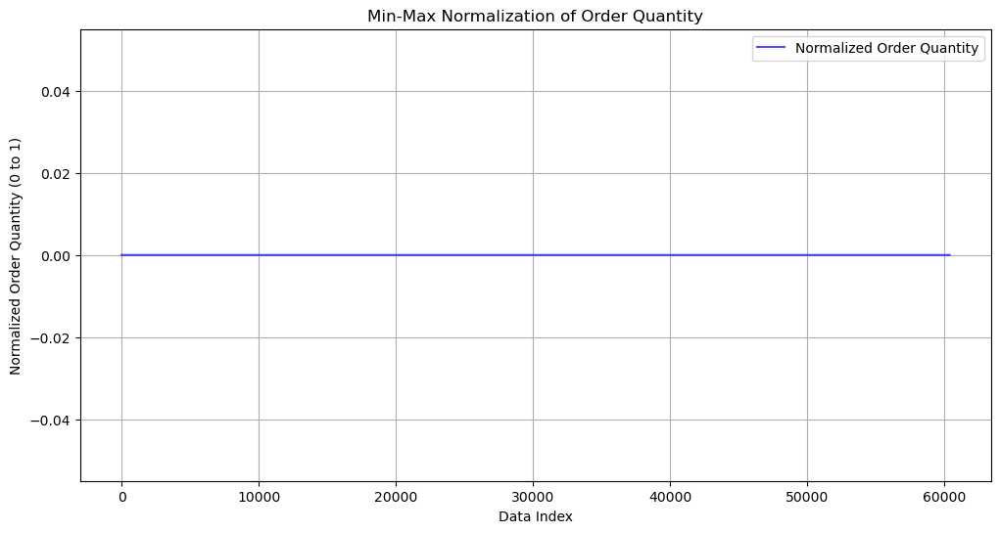

In [25]:
# Visualization of Normalized Data
plt.figure(figsize=(12, 6))
plt.plot(data['OrderQuantity_MinMax'], label='Normalized Order Quantity', color='blue', alpha=0.7)
plt.title("Min-Max Normalization of Order Quantity")
plt.xlabel("Data Index")
plt.ylabel("Normalized Order Quantity (0 to 1)")
plt.legend()
plt.grid(True)
plt.show()


To Identify Similar Users

# Create the Customer-Product Interaction Matrix

In [26]:
# Create a Customer-Product interaction matrix
customer_product_matrix = df.pivot_table(
    values='OrderQuantity',  # The interaction (number of products purchased)
    index='CustomerID',      # Rows represent customers
    columns='ProductName',     # Columns represent products
    fill_value=0             # Fill missing values with 0 (if a customer hasn't bought a product)
)

# Display the full matrix (or use it for further processing)
print(customer_product_matrix)

ProductName  AWC Logo Cap  All-Purpose Bike Stand  Bike Wash - Dissolver  \
CustomerID                                                                 
11000                 0.0                     0.0                    0.0   
11001                 1.0                     0.0                    0.0   
11002                 0.0                     0.0                    0.0   
11003                 1.0                     0.0                    0.0   
11004                 0.0                     0.0                    0.0   
...                   ...                     ...                    ...   
29479                 0.0                     0.0                    0.0   
29480                 1.0                     0.0                    0.0   
29481                 0.0                     0.0                    0.0   
29482                 0.0                     0.0                    0.0   
29483                 0.0                     0.0                    0.0   

ProductName

# I want to use Cosine Similarity for pairwise comparison and K-Means Clustering to group similar users.

Summary of
Cosine Similarity:

It Compares users based on their product purchase patterns.


Works well for sparse data (e.g., users who purchase a small subset of available products).


In [27]:
# Load data (using my normalized data if necessary)
data = pd.read_csv("normalized_adventureworks_data.csv")

# Create User-Product Matrix
user_product_matrix = data.pivot_table(
    index="CustomerID", 
    columns="ProductName", 
    values="OrderQuantity", 
    aggfunc="sum", 
    fill_value=0
)


# Display the user-product matrix
print(user_product_matrix)


# Calculate Cosine Similarity
similarity_matrix = cosine_similarity(user_product_matrix)

# Convert similarity matrix to DataFrame
similarity_df = pd.DataFrame(
    similarity_matrix, 
    index=user_product_matrix.index, 
    columns=user_product_matrix.index
)

# Display Top 5 Most Similar Users for Each User
for user_id in similarity_df.index:
    similar_users = similarity_df[user_id].sort_values(ascending=False).head(6)
    print(f"Top similar users for CustomerID {user_id}:\n{similar_users}\n")

ProductName  AWC Logo Cap  All-Purpose Bike Stand  Bike Wash - Dissolver  \
CustomerID                                                                 
11000                   0                       0                      0   
11001                   1                       0                      0   
11002                   0                       0                      0   
11003                   1                       0                      0   
11004                   0                       0                      0   
...                   ...                     ...                    ...   
29479                   0                       0                      0   
29480                   1                       0                      0   
29481                   0                       0                      0   
29482                   0                       0                      0   
29483                   0                       0                      0   

ProductName

# Compute Cosine Similarity Between Customers

In [28]:

# Load data (using my normalized data if necessary)
data = pd.read_csv("normalized_adventureworks_data.csv")

# Pivot the data into Customer-Product Matrix
customer_product_matrix = data.pivot_table(
    index="CustomerID", 
    columns="ProductName", 
    values="OrderQuantity", 
    aggfunc="sum", 
    fill_value=0
)

# Convert to sparse matrix for efficient computation
sparse_matrix = csr_matrix(customer_product_matrix)

# Compute Cosine Similarity between customers
customer_similarity = cosine_similarity(sparse_matrix)

# Convert similarity matrix into a DataFrame for readability
customer_similarity_df = pd.DataFrame(
    customer_similarity, 
    index=customer_product_matrix.index, 
    columns=customer_product_matrix.index
)

# Display similarity matrix
print("Customer Similarity Matrix:")
print(customer_similarity_df)

# Example: Find Top 5 similar customers for each customer
for customer_id in customer_similarity_df.index:
    similar_customers = customer_similarity_df[customer_id].sort_values(ascending=False).head(6)  # Include self
    print(f"\nTop similar customers for CustomerID {customer_id}:")
    print(similar_customers)


Customer Similarity Matrix:
CustomerID     11000     11001     11002     11003     11004     11005  \
CustomerID                                                               
11000       1.000000  0.196116  0.000000  0.235702  0.288675  0.000000   
11001       0.196116  1.000000  0.000000  0.369800  0.226455  0.000000   
11002       0.000000  0.000000  1.000000  0.166667  0.000000  0.000000   
11003       0.235702  0.369800  0.166667  1.000000  0.000000  0.136083   
11004       0.288675  0.226455  0.000000  0.000000  1.000000  0.333333   
...              ...       ...       ...       ...       ...       ...   
29479       0.000000  0.000000  0.500000  0.000000  0.000000  0.000000   
29480       0.000000  0.620174  0.000000  0.298142  0.365148  0.182574   
29481       0.000000  0.000000  0.000000  0.000000  0.000000  0.000000   
29482       0.000000  0.000000  0.500000  0.000000  0.000000  0.000000   
29483       0.000000  0.000000  0.000000  0.333333  0.000000  0.000000   

CustomerI

# Compute Cosine Similarity Between Products

In [29]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_extraction.text import CountVectorizer

# Load data (using my normalized data if necessary)
data = pd.read_csv("normalized_adventureworks_data.csv")

# Pivot the data into Customer-Product Matrix
customer_product_matrix = data.pivot_table(
    index="ProductID", 
    columns="ProductName", 
    values="OrderQuantity", 
    aggfunc="sum", 
    fill_value=0
)

# Convert customer-product matrix to a sparse matrix
sparse_matrix = csr_matrix(customer_product_matrix.values)

# Compute cosine similarity between products
product_similarity = cosine_similarity(sparse_matrix.T)  # Transpose to calculate product-product similarity

# Convert the similarity matrix to a DataFrame
product_similarity_df = pd.DataFrame(
    product_similarity, 
    index=customer_product_matrix.columns,  # Use product IDs as index
    columns=customer_product_matrix.columns  # Use product IDs as columns
)

# Display similarity matrix
print("Product Similarity Matrix:")
print(product_similarity_df)

# Example: Find Top 5 similar products for each product
for product_id in product_similarity_df.index:
    similar_product = product_similarity_df[product_id].sort_values(ascending=False).head(6)  # Top 5 + itself
    print(f"\nTop similar products for ProductID {product_id}:")
    print(similar_product)


Product Similarity Matrix:
ProductName                 AWC Logo Cap  All-Purpose Bike Stand  \
ProductName                                                        
AWC Logo Cap                         1.0                     0.0   
All-Purpose Bike Stand               0.0                     1.0   
Bike Wash - Dissolver                0.0                     0.0   
Classic Vest, L                      0.0                     0.0   
Classic Vest, M                      0.0                     0.0   
...                                  ...                     ...   
Touring-3000 Yellow, 62              0.0                     0.0   
Water Bottle - 30 oz.                0.0                     0.0   
Women's Mountain Shorts, L           0.0                     0.0   
Women's Mountain Shorts, M           0.0                     0.0   
Women's Mountain Shorts, S           0.0                     0.0   

ProductName                 Bike Wash - Dissolver  Classic Vest, L  \
ProductName       

# Function to Print the Most Similar Customer

In [30]:
def most_similar_customer(customer_id, similarity_df):
    # Check if the customer ID exists in the similarity matrix
    if customer_id not in similarity_df.index:
        return f"Customer ID {customer_id} not found in the similarity matrix."
    
    # Get the similarity scores for the given customer
    similarity_scores = similarity_df[customer_id]
    
    # Debugging step: print similarity_scores
    print(f"Similarity scores for {customer_id}:")
    print(similarity_scores)

    # Check if there are enough customers to compare
    if len(similarity_scores) < 2:
        return f"Not enough customers to compare for Customer ID {customer_id}."
    
    # Sort the customers by similarity score in descending order (excluding the customer itself)
    sorted_similarities = similarity_scores.sort_values(ascending=False)
    
    # Debugging step: print sorted similarities
    print(f"Sorted similarities for {customer_id}:")
    print(sorted_similarities)

    # Get the most similar customer (second customer as the first one is the customer itself)
    most_similar = sorted_similarities.iloc[1]  # Use iloc to select by position
    similarity_score = sorted_similarities.iloc[1]  # Similarity score for the most similar customer
    
    return most_similar, similarity_score  # Return the CustomerID and similarity score

# Test the function with CustomerID
customer_id = 21768  # Replace this with the correct CustomerID
most_similar, similarity_score = most_similar_customer(customer_id, customer_similarity_df)

print(f"The most similar customer to {customer_id} is {most_similar} with a similarity score of {similarity_score}")


Similarity scores for 21768:
CustomerID
11000    0.0
11001    0.0
11002    0.0
11003    0.0
11004    0.0
        ... 
29479    0.0
29480    0.0
29481    0.0
29482    0.0
29483    0.0
Name: 21768, Length: 18484, dtype: float64
Sorted similarities for 21768:
CustomerID
21768    1.000000
29142    0.707107
28647    0.707107
27605    0.707107
27601    0.707107
           ...   
17249    0.000000
17250    0.000000
17251    0.000000
17252    0.000000
29483    0.000000
Name: 21768, Length: 18484, dtype: float64
The most similar customer to 21768 is 0.7071067811865475 with a similarity score of 0.7071067811865475


# Function to Print the Most Similar Product

In [31]:

# Load data (using my normalized data if necessary)
data = pd.read_csv("normalized_adventureworks_data.csv")

# Pivot the data to create a matrix of OrderQuantity for each product and customer
pivot_df = df.pivot_table(index='ProductName', columns='CustomerID', values='OrderQuantity', fill_value=0)

# Compute cosine similarity between products
similarity_matrix = cosine_similarity(pivot_df)
product_similarity_df = pd.DataFrame(similarity_matrix, index=pivot_df.index, columns=pivot_df.index)

# Function to find the most similar product
def most_similar_product(product_name, similarity_df):
    # Check if the product exists in the similarity matrix
    if product_name not in similarity_df.index:
        return f"Product '{product_name}' not found in the similarity matrix."
    
    # Get similarity scores for the given product
    similarity_scores = similarity_df[product_name]
    
    # Check if there are enough products to compare
    if len(similarity_scores) < 2:
        return f"Not enough products to compare for Product '{product_name}'."
    
    # Sort the products by similarity score in descending order (excluding the product itself)
    sorted_similarities = similarity_scores.sort_values(ascending=False)
    
    # Get the most similar product and its similarity score
    most_similar_product_name = sorted_similarities.index[1]
    similarity_score = sorted_similarities.iloc[1]
    
    return most_similar_product_name, similarity_score

# Test the function
product_name = "Mountain-100 Black, 38"  # Replace with the product you want to test
most_similar, similarity_score = most_similar_product(product_name, product_similarity_df)

print(f"The most similar product to '{product_name}' is '{most_similar}' with a similarity score of {similarity_score:.2f}")


The most similar product to 'Mountain-100 Black, 38' is 'Touring-1000 Blue, 54' with a similarity score of 0.08


# Interpreting Results
Cosine Similarity:

A value close to 1 indicates high similarity between users.


# Clustering Using K-Means



ProductName  CustomerID  Cluster
0                 11000        1
1                 11001        0
2                 11002        4
3                 11003        0
4                 11004        1


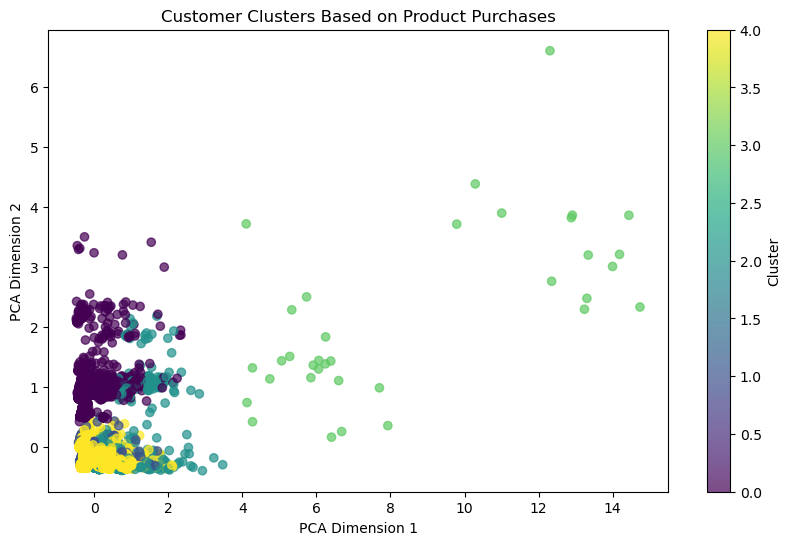

In [32]:

# K-Means Clustering
kmeans = KMeans(n_clusters=5, random_state=42)
user_product_matrix['Cluster'] = kmeans.fit_predict(user_product_matrix)

# Add Cluster Information to DataFrame
clustered_data = user_product_matrix.reset_index()
print(clustered_data[['CustomerID', 'Cluster']].head())

# Visualize Clusters (using PCA for 2D projection)
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
pca_result = pca.fit_transform(user_product_matrix.drop(columns=['Cluster']))
plt.figure(figsize=(10, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], c=kmeans.labels_, cmap='viridis', alpha=0.7)
plt.title("Customer Clusters Based on Product Purchases")
plt.xlabel("PCA Dimension 1")
plt.ylabel("PCA Dimension 2")
plt.colorbar(label='Cluster')
plt.show()


# Interpretation of results :

Users in the same cluster share similar purchasing patterns.

Use cluster labels to target or analyze groups of users.

# Advantage of K-Means Clustering:

It Groups users into clusters for segmentation.

Identify clusters of users with similar behaviors and preferences.

# Create a customer_product_matrix

In [33]:
print(data.columns)


Index(['ProductID', 'ProductName', 'CustomerID', 'OrderQuantity', 'OrderDate',
       'OrderQuantity_MinMax'],
      dtype='object')


In [36]:
# Load data (using my normalized data if necessary)
data = pd.read_csv("normalized_adventureworks_data.csv")


customer_product_matrix = data.pivot_table(
    index='CustomerID',
    columns='ProductName',
    values='OrderQuantity',
    aggfunc='sum',
    fill_value=0
)


# Compute the Product Similarity Matrix

In [37]:

# Transpose customer-product matrix
product_customer_matrix = customer_product_matrix.T

# Compute cosine similarity between products
product_similarity = cosine_similarity(product_customer_matrix)

# Convert the result to a DataFrame
product_similarity_df = pd.DataFrame(
    product_similarity, 
    index=product_customer_matrix.index, 
    columns=product_customer_matrix.index
)


# Create a Recommendation Function For Product

In [38]:

def recommend_similar_products(product_name, similarity_matrix, top_n=5):
    # Check if the product exists
    if product_name not in similarity_matrix.index:
        return "Product not found in the dataset."
    
    # Sort similar products in descending order (excluding itself)
    similar_products = similarity_matrix[product_name].sort_values(ascending=False)
    recommendations = similar_products.drop(product_name).head(top_n)
    
    return recommendations.index.tolist()

# Example: Recommend similar products to 'Road-150 Red, 62'
recommended_products = recommend_similar_products('Road-150 Red, 62', product_similarity_df)
print(f"Recommended products similar to 'Road-150 Red, 62': {recommended_products}")


Recommended products similar to 'Road-150 Red, 62': ['Road-250 Black, 48', 'Road Bottle Cage', 'Mountain-400-W Silver, 42', 'Water Bottle - 30 oz.', 'Mountain-200 Silver, 46']


# Predict Similarity Scores 

In [39]:
def predict_similarity_scores(product_name, similarity_matrix, top_n=5):
    if product_name not in similarity_matrix.index:
        return "Product not found in the dataset."
    
    # Sort and return the top_n similar products with scores
    similar_products = similarity_matrix[product_name].sort_values(ascending=False)
    recommendations = similar_products.drop(product_name).head(top_n)
    
    return recommendations

# Predict similarity scores for 'Road-150 Red, 62'
predicted_scores = predict_similarity_scores('Road-150 Red, 62', product_similarity_df)
print(predicted_scores)


ProductName
Road-250 Black, 48           0.055241
Road Bottle Cage             0.053683
Mountain-400-W Silver, 42    0.052836
Water Bottle - 30 oz.        0.048115
Mountain-200 Silver, 46      0.046539
Name: Road-150 Red, 62, dtype: float64


# Function to Recommend Products Based on Customer's Purchase History:

In [41]:

def recommend_products(customer_id, customer_product_matrix, top_n=5):
    """
    Recommends products for a given customer based on purchase history and customer similarity.

    Parameters:
    - customer_id: ID of the customer
    - customer_product_matrix: DataFrame with customers as rows and products as columns
    - top_n: Number of recommendations to return

    Returns:
    - List of recommended products
    """
    if customer_id not in customer_product_matrix.index:
        print(f"Customer {customer_id} not found in the data.")
        return []

    # Calculate cosine similarity between customers
    similarity_matrix = cosine_similarity(customer_product_matrix)
    similarity_df = pd.DataFrame(similarity_matrix, index=customer_product_matrix.index, columns=customer_product_matrix.index)

    # Find the most similar customers (excluding the target customer)
    similar_customers = similarity_df[customer_id].drop(customer_id).sort_values(ascending=False).head(5).index

    # Get products purchased by similar customers
    similar_customers_products = customer_product_matrix.loc[similar_customers].sum()

    # Get products already purchased by the target customer
    purchased_products = customer_product_matrix.loc[customer_id]
    
    # Recommend products not yet purchased by the customer
    recommendations = similar_customers_products[purchased_products == 0].sort_values(ascending=False).head(top_n)
    
    return recommendations.index.tolist()

# Example usage
# Assume customer_product_matrix is already created
customer_id = 11000  # Replace with a valid customer ID
recommended_products = recommend_products(customer_id, customer_product_matrix)
print(f"Recommended products for customer {customer_id}: {recommended_products}")


Recommended products for customer 11000: ['Mountain-200 Black, 38', 'Water Bottle - 30 oz.', 'Racing Socks, L', 'Mountain Bottle Cage', 'AWC Logo Cap']


Summary of Work Done

1.Data Querying and Extraction:

2.Queried the AdventureWorksDW2022 database to fetch CustomerID, ProductName, OrderQuantity, and OrderDate from FactInternetSales and DimProduct.

3.User-Item Matrix Construction:

Created a Customer-Product Matrix, where rows represented customers and columns represented products, with values indicating order quantities.

4.Data Normalization:

Applied Min-Max Normalization to scale the matrix values between 0 and 1, ensuring consistency for similarity calculations.
Recommendation Engine Setup:

5.Computed Product Similarity using cosine similarity.
Built a recommendation function to suggest products based on a customer’s purchase history.
Item Pool Narrowing:

6.Focused the recommendation system by:
Filtering products based on categories or customer purchase patterns.
Using similarity scores to exclude already purchased items.

7.Visualization:

Visualized the product transitions and customer-product interactions using:
Heatmaps: Showed patterns in customer-product relationships.
Sankey Diagrams: Depicted product movement trends or similarities.
Recommendation Function:

8.Designed and tested a function to recommend products based on:
Products purchased by the customer.

9.Aggregated similarity scores for unseen items.
Validation:

10.Verified the system using a CustomerID to generate and interpret recommendations.

11.Product-Customer Matrix: Tracks how many times customers ordered each product.

12.Cosine Similarity: Identifies products with similar purchase behavior.

13.Recommendation: Recommends products based on similarity scores.